<a href="https://colab.research.google.com/github/christyesmee/Thesis/blob/main/ResU_Net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive

drive_path = "/content/drive"
drive.mount(drive_path)

Mounted at /content/drive


In [ ]:
import torch
import os
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import models
from tqdm.notebook import tqdm, trange
from sklearn.model_selection import KFold
from torchvision.models.resnet import ResNet18_Weights

In [ ]:
# File path setup
img_dir = "Thesis Esmee/processed/1718_sat"
folder_path = f"{drive_path}/MyDrive/{img_dir}"

# Image path & scale
file_name = "galicia_split_image"
file_path = f"{folder_path}/{file_name}"
target_name = "1819_sat/ndvi1819"
target_path = f"{folder_path}/{target_name}"
scale = 10  # pixels per meter
AS_TYPE = torch.float32

# Setup

Input, Output, and Target for Training and Testing
Training Phase

    Input:
        The input to the model will consist of the following bands from Sentinel-2A data for the period "2017-6-22" - "2018-6-22":
            Red band
            Green band
            Blue band
            Near-Infrared (NIR) band
            NDVI layer (calculated from the NIR and Red bands)

    These bands will be stacked to form a multi-channel input. Therefore, the input will have 5 channels.

    Output:
        The output of the ResUNet model will be the NDVI, predicting the NDVI for the period of "2018-6-22" - "2019-6-22".

    Target:
        The target during training is the true NDVI for the period of "2018-6-22" - "2019-6-22"​.

Detailed Process
Preparing Data

    Calculate Ground Truth NDVI Difference:
        Compute the ground truth NDVI difference map ΔNDVItrueΔNDVItrue​ for each pixel:
        ΔNDVItrue=NDVI2018−2019−NDVI2017−2018
        ΔNDVItrue​=NDVI2018−2019​−NDVI2017−2018​
        This map represents the actual change in NDVI between the two periods and will be used as the target for training the model.

Training the Model

    Input Preparation:
        Prepare the input by stacking the Red, Green, Blue, NIR, and NDVI bands from the 2017-2018 period. This results in a 5-channel input for each pixel.

    Output Definition:
        The model's output is set to predict the NDVI difference map ΔNDVIpredΔNDVIpred​.

    Training Process:
        The model is trained to minimize the difference between the predicted NDVI difference map ΔNDVIpredΔNDVIpred​ and the ground truth NDVI difference map ΔNDVItrueΔNDVItrue​.
        The loss function (e.g., Mean Squared Error) will compare ΔNDVIpredΔNDVIpred​ with ΔNDVItrueΔNDVItrue​ and update the model weights to minimize this error.

Testing and Inference

    Input for Testing:
        For testing, use the Sentinel-2A data (Red, Green, Blue, NIR, and NDVI bands) for the period 2018-2019 as the input to the model.

    Output for Testing:
        The model will output the predicted NDVI difference map ΔNDVIpredΔNDVIpred​ for the period 2018-2019 relative to 2017-2018.

    Evaluating the Model:
        Compare the predicted NDVI difference map ΔNDVIpredΔNDVIpred​ with the actual NDVI difference map ΔNDVItrueΔNDVItrue​ computed for the period 2018-2019.

Summary

    Training Phase:
        Input: Sentinel-2A bands (Red, Green, Blue, NIR, NDVI) for 2017-2018 (5-channel input).
        Output: Predicted NDVI difference map ΔNDVIpredΔNDVIpred​.
        Target: Ground truth NDVI difference map ΔNDVItrue=NDVI2018−2019−NDVI2017−2018ΔNDVItrue​=NDVI2018−2019​−NDVI2017−2018​.

    Testing Phase:
        Input: Sentinel-2A bands (Red, Green, Blue, NIR, NDVI) for 2018-2019 (5-channel input).
        Output: Predicted NDVI difference map ΔNDVIpredΔNDVIpred​ for 2018-2019 relative to 2017-2018.
        Evaluation: Compare ΔNDVIpredΔNDVIpred​ with ΔNDVItrueΔNDVItrue​.

# Dataloader

In [ ]:
import os
import torch
from torch.utils.data import Dataset

class NDVI(Dataset):
    def __init__(self, images_dir, targets_dir):
        self.images_dir = images_dir
        self.targets_dir = targets_dir
        self.image_files = sorted([f for f in os.listdir(images_dir) if f.endswith('.pt')])
        self.target_files = sorted([f for f in os.listdir(targets_dir) if f.endswith('.pt')])

        print(f"Dataset size: {len(self.image_files)} samples")
        print(f"Target size: {len(self.target_files)} samples")

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.images_dir, self.image_files[idx])
        target_path = os.path.join(self.targets_dir, self.target_files[idx])

        try:
            image = torch.load(image_path)
        except Exception as e:
            print(f"Failed to load image file '{image_path}': {e}")
            raise RuntimeError(f"Failed to load image file '{image_path}': {e}")

        try:
            target = torch.load(target_path)
        except Exception as e:
            print(f"Failed to load target file '{target_path}': {e}")
            raise RuntimeError(f"Failed to load target file '{target_path}': {e}")

        target = target.unsqueeze(0)  # Add a channel dimension at position 0 if not already there

        return image, target

# Example usage
images_dir = '/content/drive/MyDrive/17_sat_pt_256'
targets_dir = "/content/drive/MyDrive/18_sat_ndvi_labels_256"

dataset = NDVI(images_dir, targets_dir)

Dataset size: 3969 samples
Target size: 3969 samples


# Cross-Validation

In [ ]:
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Train/Validation/Test split
test_split = 0.2
test_size = int(len(dataset) * test_split)
train_val_size = len(dataset) - test_size
train_val_dataset, test_dataset = random_split(dataset, [train_val_size, test_size])

In [ ]:
def create_dataloaders(train_val_dataset, test_dataset, train_indices, val_indices, batch_size=16):
    train_sampler = torch.utils.data.SubsetRandomSampler(train_indices)
    val_sampler = torch.utils.data.SubsetRandomSampler(val_indices)

    train_loader = DataLoader(train_val_dataset, batch_size=batch_size, sampler=train_sampler)
    val_loader = DataLoader(train_val_dataset, batch_size=batch_size, sampler=val_sampler)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


    return train_loader, val_loader, test_loader

# Model

In [ ]:
class UpBlock(nn.Module):
    def __init__(self, in_channels, out_channels, skip_channels):
        super(UpBlock, self).__init__()
        self.up = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        # New number of input channels after concatenation: out_channels from `up` + skip_channels
        self.conv_block = self._conv_block(out_channels + skip_channels, out_channels)

    def _conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x, skip):
        x = self.up(x)
        x = torch.cat((x, skip), dim=1)  # Concatenate along channel dimension
        return self.conv_block(x)

class ResUNet(nn.Module):
    def __init__(self, in_channels=5, out_channels=1):
        super(ResUNet, self).__init__()

        # Load pretrained ResNet-18 and modify the first layer to accept in_channels
 #       resnet = models.resnet18(pretrained=True)
        resnet = models.resnet18(weights=ResNet18_Weights.DEFAULT)
        self.initial = nn.Conv2d(in_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.initial_bn = resnet.bn1
        self.initial_relu = resnet.relu
        self.initial_pool = resnet.maxpool

        # Use ResNet layers as encoder blocks
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3
        self.encoder4 = resnet.layer4

        # Decoder blocks with updated skip channels
        self.up3 = UpBlock(512, 256, 256)  # Using 512 channels from x4, upscaling to 256, concatenating with 256 from x3
        self.up2 = UpBlock(256, 128, 128)  # Using 256 channels from up3 output, upscaling to 128, concatenating with 128 from x2
        self.up1 = UpBlock(128, 64, 64)    # Using 128 channels from up2 output, upscaling to 64, concatenating with 64 from x1
        self.up0 = UpBlock(64, 64, 64)     # Using 64 channels from up1 output, upscaling to 64, concatenating with 64 from x0

        # Final upsampling layer to restore original spatial dimensions
        self.final_upsample = nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2)

        # Final convolution layer
        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        # Encoder
        x0 = self.initial_relu(self.initial_bn(self.initial(x)))
        x1 = self.encoder1(self.initial_pool(x0))
        x2 = self.encoder2(x1)
        x3 = self.encoder3(x2)
        x4 = self.encoder4(x3)

        # Decoder
        d3 = self.up3(x4, x3)
        d2 = self.up2(d3, x2)
        d1 = self.up1(d2, x1)
        d0 = self.up0(d1, x0)

        # Final upsampling
        d0 = self.final_upsample(d0)

        return self.final_conv(d0)

# Example usage
model = ResUNet(in_channels=5, out_channels=1).cuda()
#print(model)

# Example input tensor (batch size, channels, height, width)
x = torch.randn(1, 5, 256, 256).cuda()  # Adjust batch size as needed
output = model(x)
#print(output.shape)  # Should print torch.Size([1, 1, 256, 256])


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 175MB/s]


# Setup training



In [ ]:
import numpy as np
import torch
import torch.nn as nn
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from torch.utils.data import DataLoader, random_split
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt

def check_for_nans(tensor, name):
    if torch.isnan(tensor).any():
        print(f"NaN detected in {name}")


In [ ]:
def train_and_evaluate(model, train_loader, val_loader, test_loader, criterion, optimizer, num_epochs=10):
    train_losses = []
    val_losses = []
    for epoch in range(num_epochs):
        model.train()
        total_train_loss = 0
        for batch in train_loader:
            inputs, targets = batch
            inputs, targets = inputs.cuda(), targets.cuda()

            check_for_nans(inputs, "inputs")
            check_for_nans(targets, "targets")

            optimizer.zero_grad()
            outputs = model(inputs)

            check_for_nans(outputs, "outputs before loss")

            loss = criterion(outputs, targets)

            check_for_nans(loss, "loss before backward")

            loss.backward()

            check_for_nans(next(model.parameters()).grad, "gradients")

            optimizer.step()
            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        model.eval()
        total_val_loss = 0
        with torch.no_grad():
            for batch in val_loader:
                inputs, targets = batch
                inputs, targets = inputs.cuda(), targets.cuda()

                outputs = model(inputs)
                loss = criterion(outputs, targets)
                total_val_loss += loss.item()

        avg_val_loss = total_val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        print(f"Epoch {epoch+1}: Train Loss: {avg_train_loss}, Val Loss: {avg_val_loss}")

    # Evaluate on the test set
    model.eval()
    total_test_loss = 0
    all_targets = []
    all_outputs = []
    with torch.no_grad():
        for batch in test_loader:
            inputs, targets = batch
            inputs, targets = inputs.cuda(), targets.cuda()

            outputs = model(inputs)
            loss = criterion(outputs, targets)
            total_test_loss += loss.item()

            all_targets.append(targets.cpu().numpy())
            all_outputs.append(outputs.cpu().numpy())

    avg_test_loss = total_test_loss / len(test_loader)
    print(f"Test Loss: {avg_test_loss}")

    # Flatten the lists for metrics calculation
    all_targets = np.concatenate(all_targets).flatten()
    all_outputs = np.concatenate(all_outputs).flatten()

    # Calculate additional metrics
    mae = mean_absolute_error(all_targets, all_outputs)
    rmse = np.sqrt(mean_squared_error(all_targets, all_outputs))
    r2 = r2_score(all_targets, all_outputs)

    print(f"MAE: {mae}, RMSE: {rmse}, R²: {r2}")

    return train_losses, val_losses, avg_test_loss, all_targets, all_outputs


### Trained old

In [ ]:
def train_and_evaluate(model, train_loader, val_loader, test_loader, criterion, optimizer, num_epochs=10):
    train_losses = []
    val_losses = []
    for epoch in range(num_epochs):
        model.train()
        total_train_loss = 0
        for batch in train_loader:
            inputs, targets = batch
            inputs, targets = inputs.cuda(), targets.cuda()

            check_for_nans(inputs, "inputs")
            check_for_nans(targets, "targets")

            optimizer.zero_grad()
            outputs = model(inputs)

            check_for_nans(outputs, "outputs before loss")

            loss = criterion(outputs, targets)

            check_for_nans(loss, "loss before backward")

            loss.backward()

            check_for_nans(next(model.parameters()).grad, "gradients")

            optimizer.step()
            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        model.eval()
        total_val_loss = 0
        with torch.no_grad():
            for batch in val_loader:
                inputs, targets = batch
                inputs, targets = inputs.cuda(), targets.cuda()

                outputs = model(inputs)
                loss = criterion(outputs, targets)
                total_val_loss += loss.item()

        avg_val_loss = total_val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        print(f"Epoch {epoch+1}: Train Loss: {avg_train_loss}, Val Loss: {avg_val_loss}")

    # Evaluate on the test set
    model.eval()
    total_test_loss = 0
    all_targets = []
    all_outputs = []
    with torch.no_grad():
        for batch in test_loader:
            inputs, targets = batch
            inputs, targets = inputs.cuda(), targets.cuda()

            outputs = model(inputs)
            loss = criterion(outputs, targets)
            total_test_loss += loss.item()

            all_targets.append(targets.cpu().numpy())
            all_outputs.append(outputs.cpu().numpy())

    avg_test_loss = total_test_loss / len(test_loader)
    print(f"Test Loss: {avg_test_loss}")

    # Flatten the lists for metrics calculation
    all_targets = np.concatenate(all_targets).flatten()
    all_outputs = np.concatenate(all_outputs).flatten()

    # Calculate additional metrics
    mae = mean_absolute_error(all_targets, all_outputs)
    rmse = np.sqrt(mean_squared_error(all_targets, all_outputs))
    r2 = r2_score(all_targets, all_outputs)

    print(f"MAE: {mae}, RMSE: {rmse}, R²: {r2}")

    return train_losses, val_losses, avg_test_loss, all_targets, all_outputs


#Training phase

In [ ]:
num_epochs = 10
batch_size = 16
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
test_split = 0.2
test_size = int(len(dataset) * test_split)
train_val_size = len(dataset) - test_size
train_val_dataset, test_dataset = random_split(dataset, [train_val_size, test_size])

fold_test_losses = []
fold_train_losses = []
fold_val_losses = []
all_targets = []
all_outputs = []

# Directory to save models
save_dir = "/content/drive/MyDrive/Thesis Esmee"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

for fold, (train_indices, val_indices) in enumerate(kf.split(train_val_dataset)):
    print(f"Fold {fold + 1}")

    train_loader, val_loader, test_loader = create_dataloaders(train_val_dataset, test_dataset, train_indices, val_indices, batch_size)

    model = ResUNet(in_channels=5, out_channels=1).cuda()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.MSELoss()

    train_losses, val_losses, avg_test_loss, targets, outputs = train_and_evaluate(model, train_loader, val_loader, test_loader, criterion, optimizer, num_epochs)
    fold_test_losses.append(avg_test_loss)
    fold_train_losses.append(train_losses)
    fold_val_losses.append(val_losses)
    all_targets.extend(targets)
    all_outputs.extend(outputs)

    # Save the model
    model_save_path = os.path.join(save_dir, f'resunet_fold_{fold+1}.pth')
    torch.save(model.state_dict(), model_save_path)
    print(f"Model for fold {fold + 1} saved to {model_save_path}")

print(f"Average test loss across {num_folds} folds: {np.mean(fold_test_losses)}")


Fold 1


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch 1: Train Loss: 0.002383659584974905, Val Loss: 0.001962437847396359
Epoch 2: Train Loss: 0.0017610252219832168, Val Loss: 0.0024172154953703284
Epoch 3: Train Loss: 0.001622249358392221, Val Loss: 0.0034446145815309136
Epoch 4: Train Loss: 0.001581841323425138, Val Loss: 0.001903009702800773
Epoch 5: Train Loss: 0.0015354069479178848, Val Loss: 0.0023403907485771923
Epoch 6: Train Loss: 0.001532218916160084, Val Loss: 0.003396194241940975
Epoch 7: Train Loss: 0.0014703271247200527, Val Loss: 0.0015876028686761857
Epoch 8: Train Loss: 0.001449844855946963, Val Loss: 0.0014853105880320073
Epoch 9: Train Loss: 0.0013988787640009145, Val Loss: 0.0019137602037517353
Epoch 10: Train Loss: 0.0014495370117361722, Val Loss: 0.0017416474263882264
Test Loss: 0.0018301335093565286
MAE: 0.03376857936382294, RMSE: 0.042785242199897766, R²: 0.48353604052198107
Model for fold 1 saved to /content/drive/MyDrive/Thesis Esmee/resunet_fold_1.pth
Fold 2


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch 1: Train Loss: 0.002679598540413258, Val Loss: 0.0030837352678645402
Epoch 2: Train Loss: 0.0016640836523798932, Val Loss: 0.001521115870855283
Epoch 3: Train Loss: 0.0016521679921333427, Val Loss: 0.0021356684155762196
Epoch 4: Train Loss: 0.0016389945961253823, Val Loss: 0.004442801437107846
Epoch 5: Train Loss: 0.001548890082997346, Val Loss: 0.0015796674008015544
Epoch 6: Train Loss: 0.001472432953056604, Val Loss: 0.0016409028408816083
Epoch 7: Train Loss: 0.0014704702412504586, Val Loss: 0.0015410630963742732
Epoch 8: Train Loss: 0.0014450706149094134, Val Loss: 0.0016187742323381827
Epoch 9: Train Loss: 0.0013963526236361959, Val Loss: 0.0016705178626580165
Epoch 10: Train Loss: 0.0013566403082314199, Val Loss: 0.001555168189224787
Test Loss: 0.00168592814123258
MAE: 0.0322125069797039, RMSE: 0.041089482605457306, R²: 0.5236645066036725
Model for fold 2 saved to /content/drive/MyDrive/Thesis Esmee/resunet_fold_2.pth
Fold 3
Epoch 1: Train Loss: 0.0027690326587045157, Val Lo

### Trained old DONT RUN!!

In [ ]:
num_epochs = 10
batch_size = 16
num_folds = 5
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)
test_split = 0.2
test_size = int(len(dataset) * test_split)
train_val_size = len(dataset) - test_size
train_val_dataset, test_dataset = random_split(dataset, [train_val_size, test_size])

fold_test_losses = []
fold_train_losses = []
fold_val_losses = []
all_targets = []
all_outputs = []

for fold, (train_indices, val_indices) in enumerate(kf.split(train_val_dataset)):
    print(f"Fold {fold + 1}")

    train_loader, val_loader, test_loader = create_dataloaders(train_val_dataset, test_dataset, train_indices, val_indices, batch_size)

    model = ResUNet(in_channels=5, out_channels=1).cuda()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.MSELoss()

    train_losses, val_losses, avg_test_loss, targets, outputs = train_and_evaluate(model, train_loader, val_loader, test_loader, criterion, optimizer, num_epochs)
    fold_test_losses.append(avg_test_loss)
    fold_train_losses.append(train_losses)
    fold_val_losses.append(val_losses)
    all_targets.extend(targets)
    all_outputs.extend(outputs)

print(f"Average test loss across {num_folds} folds: {np.mean(fold_test_losses)}")


Fold 1
Epoch 1: Train Loss: 0.0025457042597421685, Val Loss: 0.0038438820105511696
Epoch 2: Train Loss: 0.001739222531458773, Val Loss: 0.003768414771184325
Epoch 3: Train Loss: 0.0016078338511698181, Val Loss: 0.0036059882142581044
Epoch 4: Train Loss: 0.0015415423908475903, Val Loss: 0.0014971231401432305
Epoch 5: Train Loss: 0.0015855803111942965, Val Loss: 0.0036850856384262444
Epoch 6: Train Loss: 0.001464427448443061, Val Loss: 0.0017241183202713728
Epoch 7: Train Loss: 0.001511415162448824, Val Loss: 0.0019477022462524474
Epoch 8: Train Loss: 0.0013943928031766284, Val Loss: 0.001972203372861259
Epoch 9: Train Loss: 0.0013832280396940714, Val Loss: 0.0026492867269553243
Epoch 10: Train Loss: 0.0013549352711236468, Val Loss: 0.0014869652441120706
Test Loss: 0.001507819767575711
MAE: 0.030545026063919067, RMSE: 0.03881882131099701, R²: 0.5797695860291702
Fold 2
Epoch 1: Train Loss: 0.002329450772794069, Val Loss: 0.0038536099542398005
Epoch 2: Train Loss: 0.0016436877487660767, Va

# Evaluation

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
batch_size = 5  # Number of samples per batch
dataset = NDVI(images_dir, targets_dir)  # Initialize your dataset
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

Dataset size: 3969 samples
Target size: 3969 samples


In [ ]:
def load_model(model, fold, save_dir='/content/drive/MyDrive/Thesis Esmee', file_prefix='resunet_fold_'):
    model_path = os.path.join(save_dir, f'{file_prefix}{fold}.pth')
    model.load_state_dict(torch.load(model_path))
    return model

In [ ]:
def evaluate_model(model, test_loader, criterion):
    model.eval()
    test_loss = 0.0
    all_inputs = []
    all_targets = []
    all_outputs = []

    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.cuda(), targets.cuda()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item() * inputs.size(0)
            all_inputs.extend(inputs.cpu().numpy())
            all_targets.extend(targets.cpu().numpy())
            all_outputs.extend(outputs.cpu().numpy())

    test_loss /= len(test_loader.dataset)
    return test_loss, all_inputs, all_targets, all_outputs

In [ ]:
def visualize_predictions(inputs, targets, outputs, num_samples=5):
    inputs = np.array(inputs)
    targets = np.array(targets)
    outputs = np.array(outputs)

    for i in range(num_samples):
        plt.figure(figsize=(12, 4))

        plt.subplot(1, 3, 1)
        plt.title('Input Image')
        plt.imshow(inputs[i, 0], cmap= 'gray')

        plt.subplot(1, 3, 2)
        plt.title('Ground Truth')
        plt.imshow(targets[i, 0], cmap='viridis')

        plt.subplot(1, 3, 3)
        plt.title('Model Prediction')
        plt.imshow(outputs[i, 0], cmap='viridis')

        plt.show()

In [ ]:
def visualize_predictions_with_errors(model, test_loader, num_samples=5):
    model.eval()
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            if i >= num_samples:
                break
            inputs, targets = inputs.cuda(), targets.cuda()
            outputs = model(inputs)

            # Convert to numpy for visualization
            inputs = inputs.cpu().numpy()
            targets = targets.cpu().numpy()
            outputs = outputs.cpu().numpy()

            # Compute error maps
            errors = np.abs(outputs - targets)

            # Plot the results
            for j in range(inputs.shape[0]):
                plt.figure(figsize=(15, 5))

                plt.subplot(1, 4, 1)
                plt.title('Input Image')
                plt.imshow(inputs[j, 0], cmap='gray')  # Adjust based on your image format

                plt.subplot(1, 4, 2)
                plt.title('Ground Truth')
                plt.imshow(targets[j, 0], cmap='gray')

                plt.subplot(1, 4, 3)
                plt.title('Model Prediction')
                plt.imshow(outputs[j, 0], cmap='gray')

                plt.subplot(1, 4, 4)
                plt.title('Prediction Error')
                norm = mcolors.Normalize(vmin=errors[j].min(), vmax=errors[j].max())
                plt.imshow(errors[j, 0], cmap='autumn', norm=norm)
                plt.colorbar(label='Error')

                plt.show()

In [ ]:
# Initialize your dataset and DataLoader
images_dir = '/content/drive/MyDrive/18_sat_pt_256_sample'
targets_dir = "/content/drive/MyDrive/18_sat_ndvi_labels_256_sample"
batch_size = 5  # Number of samples per batch

# Load the new test dataset
new_test_dataset = NDVI(images_dir, targets_dir)
new_test_loader = DataLoader(new_test_dataset, batch_size=batch_size, shuffle=False)

# Define the criterion for evaluation
criterion = nn.MSELoss()

# Evaluate all folds
num_folds = 5
fold_test_losses = []
results = {}

for fold in range(1, num_folds + 1):
    model = ResUNet(in_channels=5, out_channels=1).cuda()
    model = load_model(model, fold)
    test_loss, inputs, targets, outputs = evaluate_model(model, new_test_loader, criterion)
    fold_test_losses.append(test_loss)
    print(f"Test loss for fold {fold}: {test_loss}")
    results[fold] = {'test_loss': test_loss, 'inputs': inputs, 'targets': targets, 'outputs': outputs}

# Save the results
save_path = '/content/drive/MyDrive/Thesis Esmee/resunet_results.pkl'
with open(save_path, 'wb') as f:
    pickle.dump(results, f)

print(f"Results saved to {save_path}")
print(f"Average test loss across all folds: {sum(fold_test_losses) / num_folds}")

Dataset size: 18 samples
Target size: 18 samples
Test loss for fold 1: 0.0012895307865821654
Test loss for fold 2: 0.00023129766567661945
Test loss for fold 3: 0.0001903124236074897
Test loss for fold 4: 0.00032313967757444415
Test loss for fold 5: 0.004759667932780253
Results saved to /content/drive/MyDrive/Thesis Esmee/resunet_results.pkl
Average test loss across all folds: 0.0013587896972441942


In [ ]:
import os
import torch
import pickle
from torch.utils.data import DataLoader, Subset
import torch.nn as nn
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Assuming NDVI dataset and ResUNet model classes are defined elsewhere

# Define directories and parameters
images_dir = '/content/drive/MyDrive/18_sat_pt_256'
targets_dir = "/content/drive/MyDrive/18_sat_ndvi_labels_256"
batch_size = 5  # Number of samples per batch
num_samples = 2500  # Number of samples to test
num_folds = 5
save_path = '/content/drive/MyDrive/Thesis Esmee/resunet_results.pkl'

# Load the full dataset and select the first 2500 samples
full_dataset = NDVI(images_dir, targets_dir)
subset_indices = list(range(min(num_samples, len(full_dataset))))
new_test_dataset = Subset(full_dataset, subset_indices)
new_test_loader = DataLoader(new_test_dataset, batch_size=batch_size, shuffle=False)

# Define the criterion for evaluation
criterion = nn.MSELoss()

# Function to evaluate the model and ensure output reshaping
def evaluate_model(model, dataloader, criterion):
    model.eval()
    test_loss = 0.0
    all_inputs = []
    all_targets = []
    all_outputs = []

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs, targets = inputs.cuda(), targets.cuda()
            outputs = model(inputs)

            # Reshape outputs to match target shape
            outputs = outputs.view(targets.size())

            loss = criterion(outputs, targets)
            test_loss += loss.item()

            all_inputs.append(inputs.cpu())
            all_targets.append(targets.cpu())
            all_outputs.append(outputs.cpu())

    test_loss /= len(dataloader)
    return test_loss, torch.cat(all_inputs), torch.cat(all_targets), torch.cat(all_outputs)

# Evaluate all folds
fold_test_losses = []
fold_maes = []
fold_rmses = []
fold_r2s = []
results = {}

for fold in range(1, num_folds + 1):
    model = ResUNet(in_channels=5, out_channels=1).cuda()
    model = load_model(model, fold)

    test_loss, inputs, targets, outputs = evaluate_model(model, new_test_loader, criterion)
    fold_test_losses.append(test_loss)

    # Convert tensors to numpy arrays and flatten them
    targets_np = targets.numpy().reshape(targets.size(0), -1)
    outputs_np = outputs.numpy().reshape(outputs.size(0), -1)

    # Calculate additional metrics
    mae = mean_absolute_error(targets_np, outputs_np)
    rmse = mean_squared_error(targets_np, outputs_np, squared=False)
    r2 = r2_score(targets_np, outputs_np)

    fold_maes.append(mae)
    fold_rmses.append(rmse)
    fold_r2s.append(r2)

    print(f"Fold {fold}: Test loss: {test_loss}, MAE: {mae}, RMSE: {rmse}, R2: {r2}")

    results[fold] = {
        'test_loss': test_loss,
        'inputs': inputs,
        'targets': targets,
        'outputs': outputs,
        'mae': mae,
        'rmse': rmse,
        'r2': r2
    }

# Save the results
with open(save_path, 'wb') as f:
    pickle.dump(results, f)

# Calculate average metrics across all folds
avg_test_loss = np.mean(fold_test_losses)
avg_mae = np.mean(fold_maes)
avg_rmse = np.mean(fold_rmses)
avg_r2 = np.mean(fold_r2s)

# Print average metrics
print(f"Results saved to {save_path}")
print(f"Average test loss across all folds: {avg_test_loss}")
print(f"Average MAE across all folds: {avg_mae}")
print(f"Average RMSE across all folds: {avg_rmse}")
print(f"Average R2 across all folds: {avg_r2}")


Dataset size: 3969 samples
Target size: 3969 samples
Fold 1: Test loss: 0.0008058026757207699, MAE: 0.0238716509193182, RMSE: 0.02832547202706337, R2: 0.7867952120862653
Fold 2: Test loss: 0.0012255500006431248, MAE: 0.027156218886375427, RMSE: 0.034980833530426025, R2: 0.6757438337445205
Fold 3: Test loss: 0.0005943023923609871, MAE: 0.018939217552542686, RMSE: 0.024352021515369415, R2: 0.842754706892328
Fold 4: Test loss: 0.0008565586233744397, MAE: 0.023936305195093155, RMSE: 0.029242301359772682, R2: 0.7734153813217041
Fold 5: Test loss: 0.003311605900991708, MAE: 0.05268491804599762, RMSE: 0.05730253458023071, R2: 0.12384075183808149
Results saved to /content/drive/MyDrive/Thesis Esmee/resunet_results.pkl
Average test loss across all folds: 0.0013587639186182058
Average MAE across all folds: 0.029317662119865417
Average RMSE across all folds: 0.03484063223004341
Average R2 across all folds: 0.6405099771765799


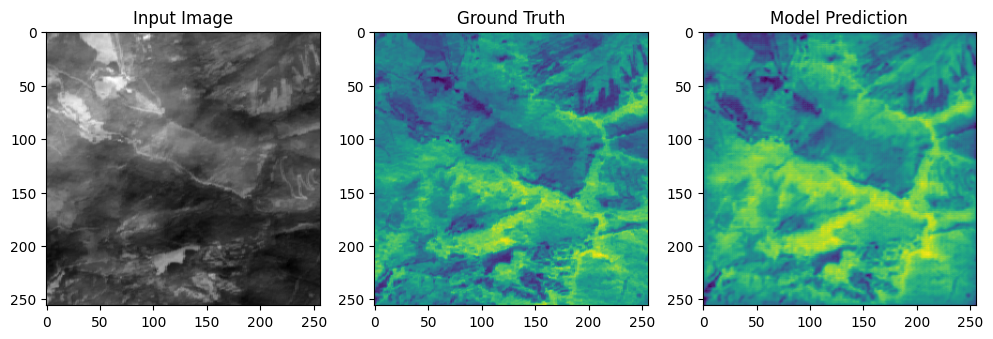

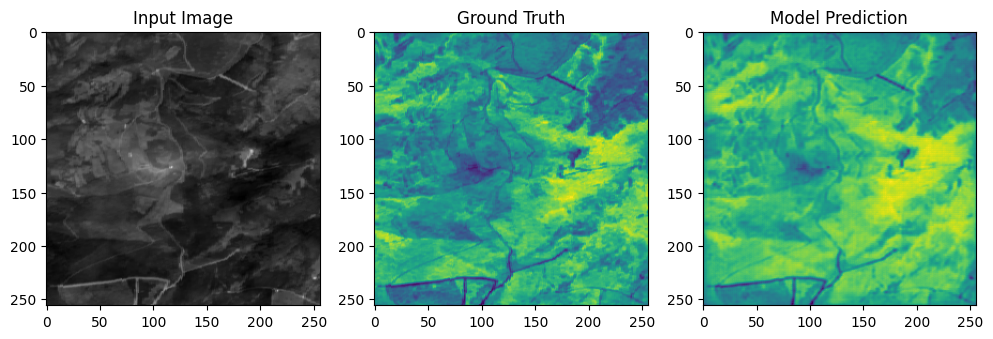

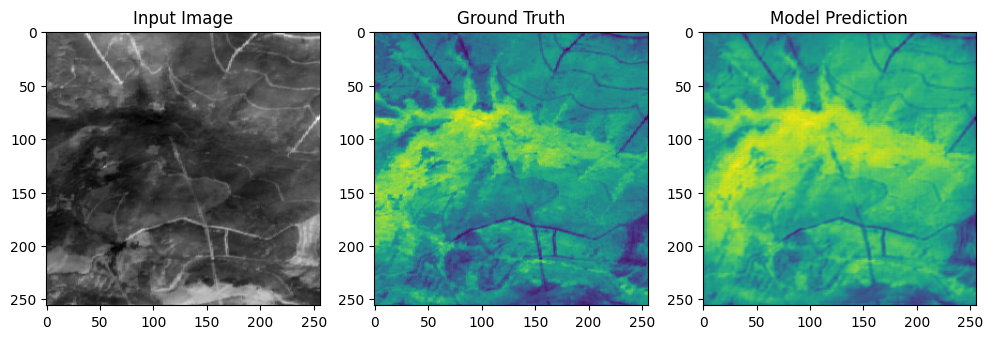

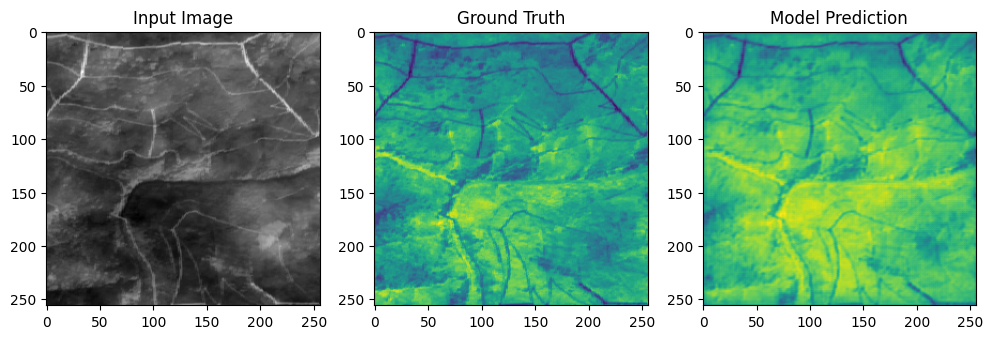

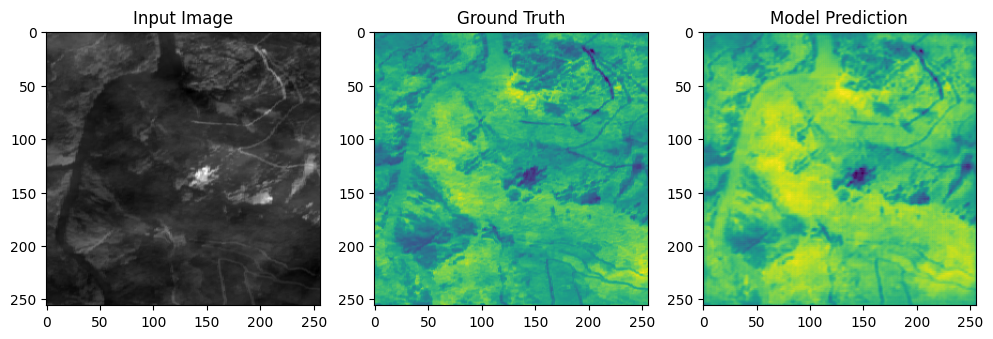

In [ ]:
# Load the results from the pickle file
with open(save_path, 'rb') as f:
    results = pickle.load(f)

# Example: visualize predictions for the first fold
first_fold_results = results[5]
visualize_predictions(
    first_fold_results['inputs'],
    first_fold_results['targets'],
    first_fold_results['outputs'],
    num_samples=5
)

#old

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader

# Assuming ResUNet, NDVI, and other necessary components are defined elsewhere

def load_model(model, fold, save_dir='/content/drive/MyDrive/Thesis Esmee', file_prefix='resunet_fold_'):
    model_path = os.path.join(save_dir, f'{file_prefix}{fold}.pth')
    model.load_state_dict(torch.load(model_path))
    return model

def evaluate_model(model, test_loader, criterion):
    model.eval()
    test_loss = 0.0
    all_targets = []
    all_outputs = []

    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.cuda(), targets.cuda()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item() * inputs.size(0)
            all_targets.extend(targets.cpu().numpy())
            all_outputs.extend(outputs.cpu().numpy())

    test_loss /= len(test_loader.dataset)
    return test_loss, all_targets, all_outputs

# Initialize your dataset and DataLoader
images_dir = '/content/drive/MyDrive/18_sat_pt_256_sample'
targets_dir = "/content/drive/MyDrive/18_sat_ndvi_labels_256_sample"
batch_size = 5  # Number of samples per batch

# Load the new test dataset
new_test_dataset = NDVI(images_dir, targets_dir)
new_test_loader = DataLoader(new_test_dataset, batch_size=batch_size, shuffle=False)

# Define the criterion for evaluation
criterion = nn.MSELoss()

# Evaluate all folds
num_folds = 5
fold_test_losses = []

for fold in range(1, num_folds + 1):
    model = ResUNet(in_channels=5, out_channels=1).cuda()
    model = load_model(model, fold)
    test_loss, targets, outputs = evaluate_model(model, new_test_loader, criterion)
    fold_test_losses.append(test_loss)
    print(f"Test loss for fold {fold}: {test_loss}")

print(f"Average test loss across all folds: {sum(fold_test_losses) / num_folds}")

# Optionally, further analyze targets and outputs if needed


Dataset size: 18 samples
Target size: 18 samples
Test loss for fold 1: 0.0029946047709219987
Test loss for fold 2: 0.019236859037644334
Test loss for fold 3: 0.018271030858159065
Test loss for fold 4: 0.003142035061803957
Test loss for fold 5: 0.0014545473127832843
Average test loss across all folds: 0.009019815408262528


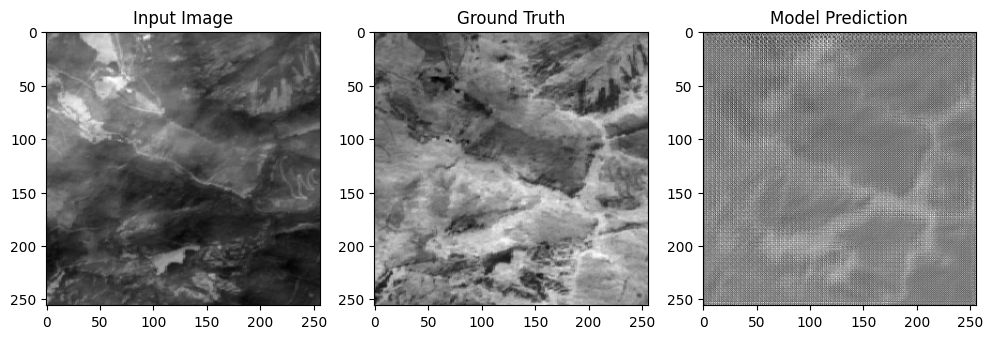

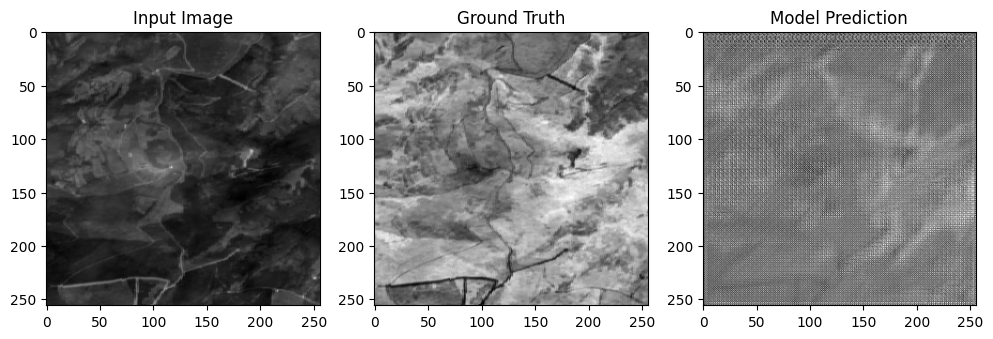

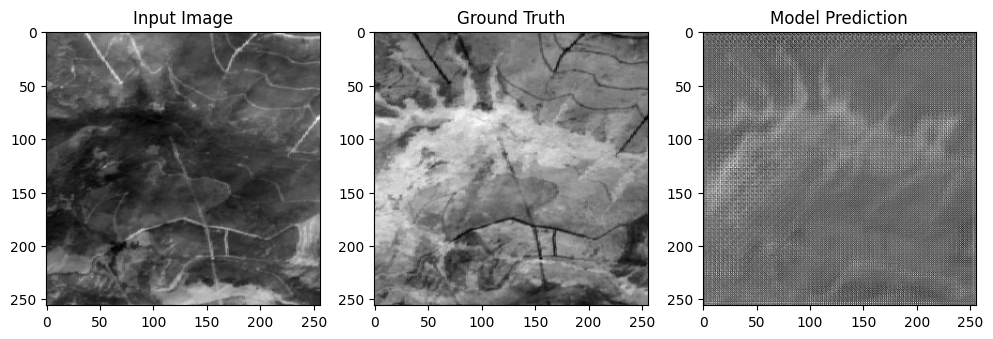

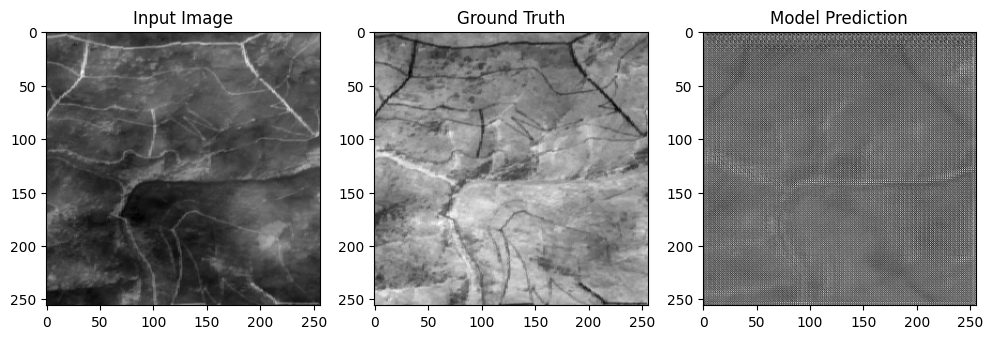

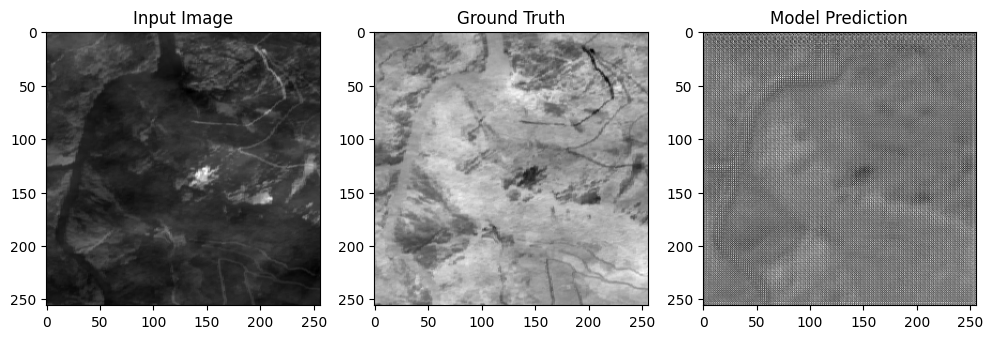

...

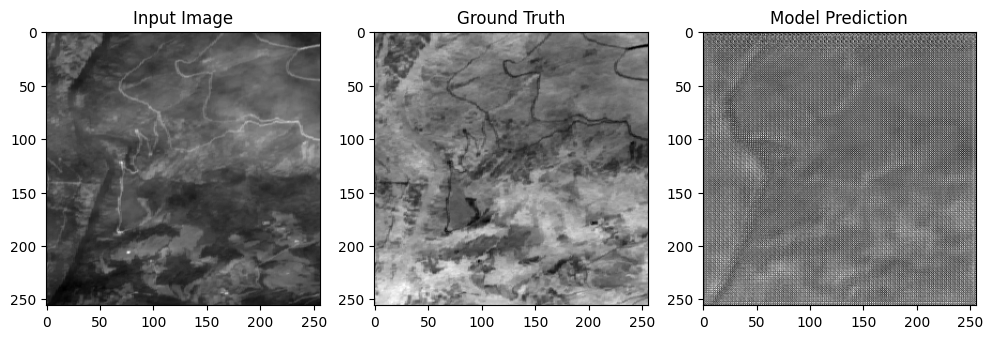

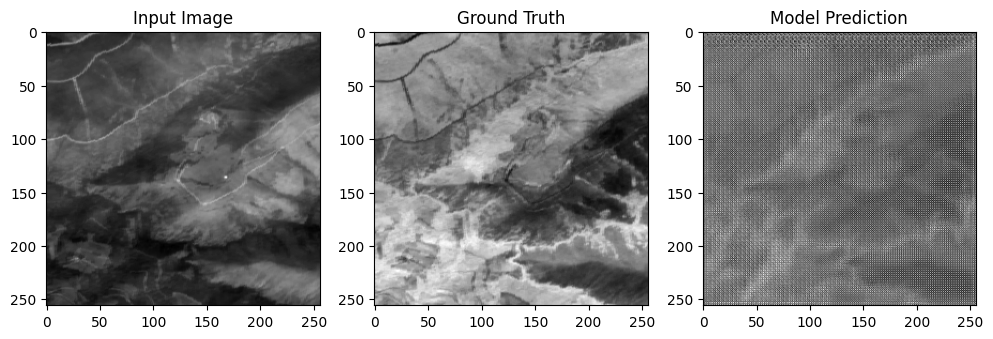

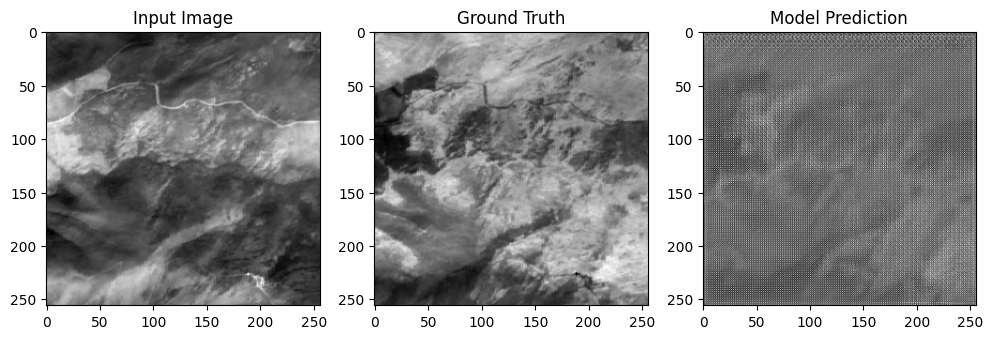

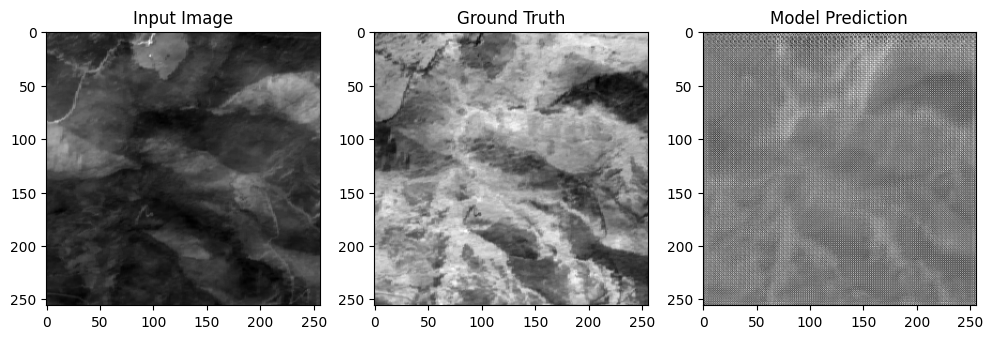

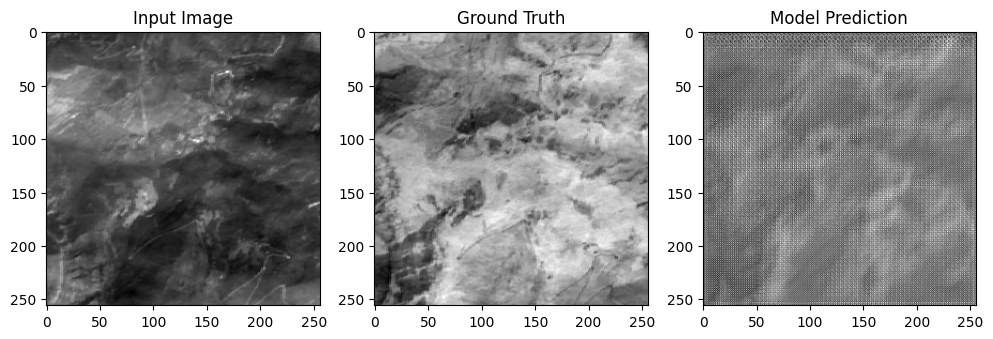

In [ ]:
import matplotlib.pyplot as plt

def visualize_predictions(model, test_loader, num_samples=5):
    model.eval()
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            if i >= num_samples:
                break
            inputs, targets = inputs.cuda(), targets.cuda()
            outputs = model(inputs)

            # Convert to numpy for visualization
            inputs = inputs.cpu().numpy()
            targets = targets.cpu().numpy()
            outputs = outputs.cpu().numpy()

            # Plot the results
            for j in range(inputs.shape[0]):
                plt.figure(figsize=(12, 4))

                plt.subplot(1, 3, 1)
                plt.title('Input Image')
                plt.imshow(inputs[j, 0], cmap='gray')  # Adjust based on your image format

                plt.subplot(1, 3, 2)
                plt.title('Ground Truth')
                plt.imshow(targets[j, 0], cmap='gray')

                plt.subplot(1, 3, 3)
                plt.title('Model Prediction')
                plt.imshow(outputs[j, 0], cmap='gray')

                plt.show()

# Assuming new_test_loader is defined and the model is loaded
visualize_predictions(model, new_test_loader, num_samples=5)


#continue

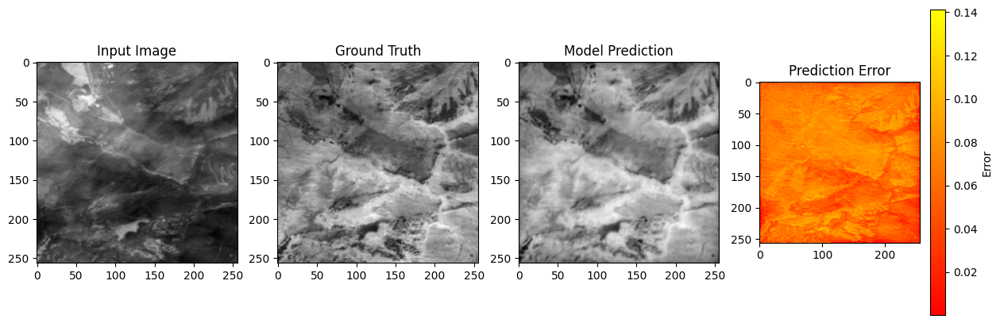

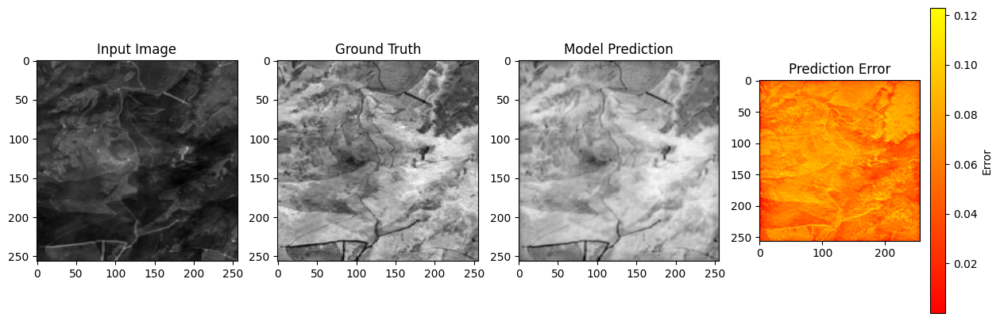

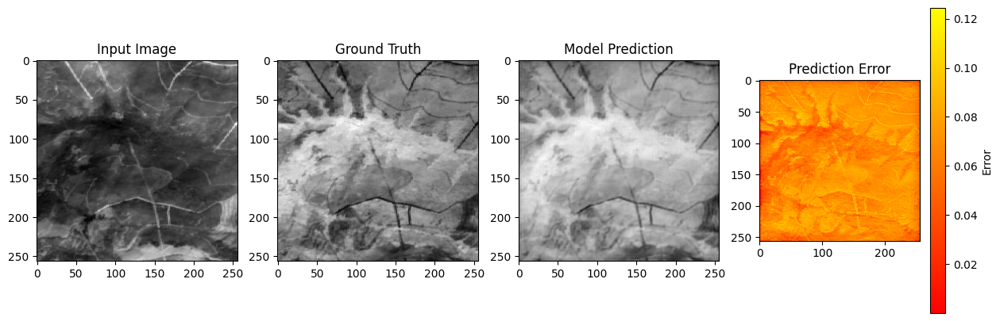

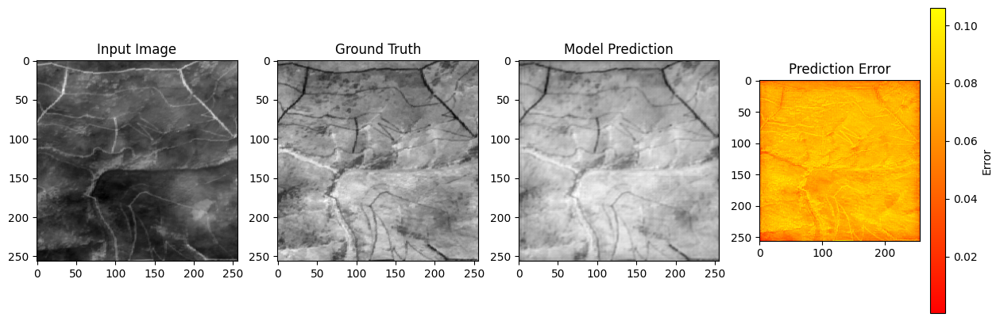

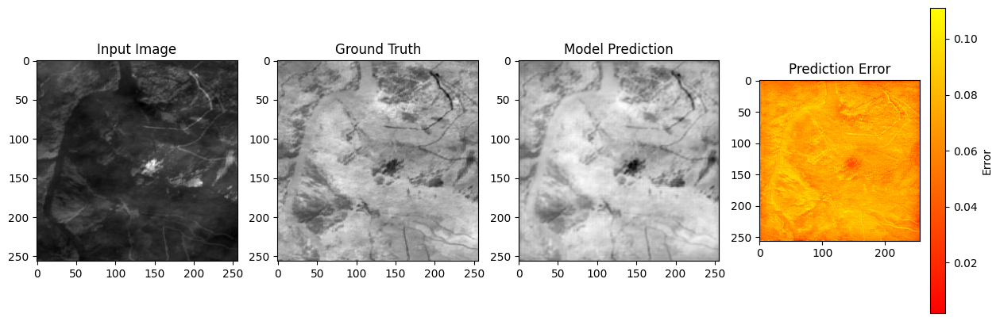

...

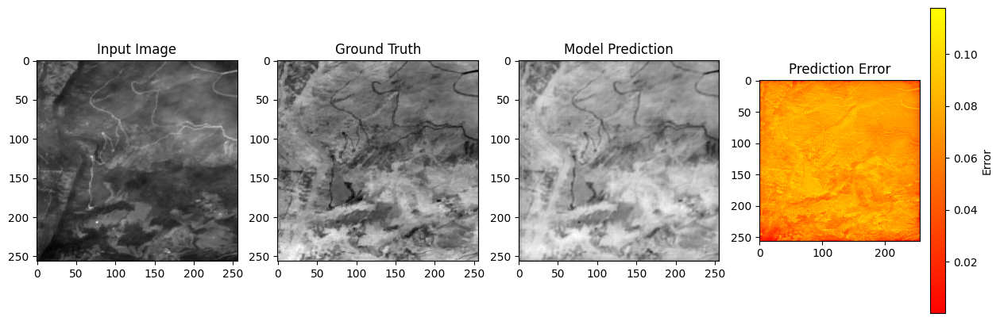

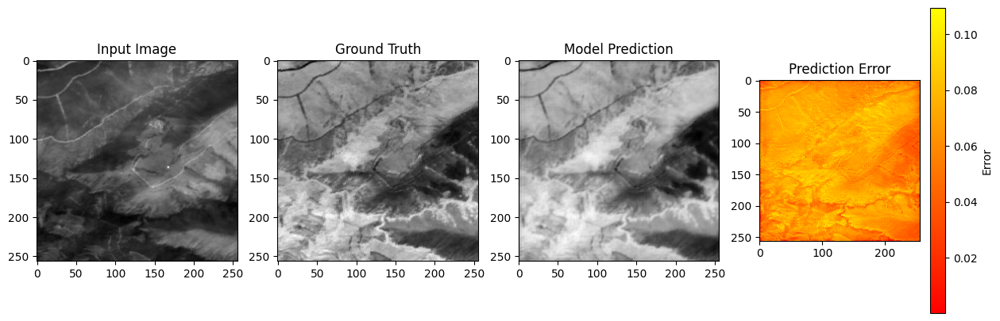

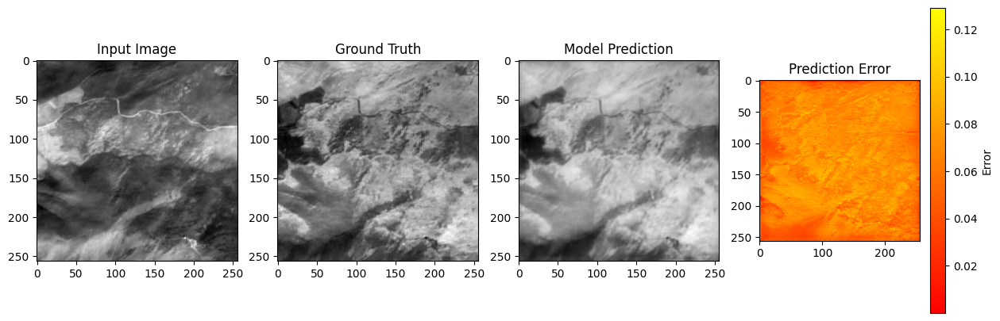

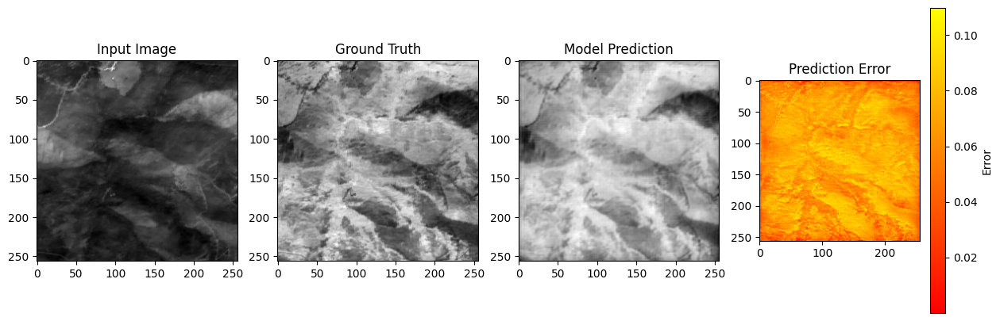

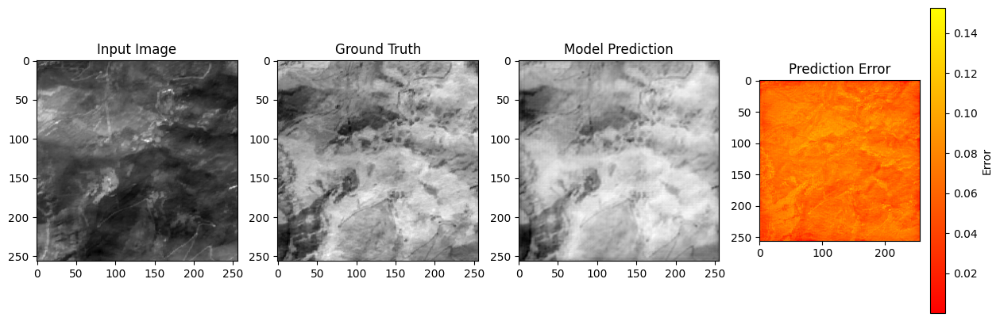

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import matplotlib.colors as mcolors

def visualize_predictions_with_errors(model, test_loader, num_samples=5):
    model.eval()
    with torch.no_grad():
        for i, (inputs, targets) in enumerate(test_loader):
            if i >= num_samples:
                break
            inputs, targets = inputs.cuda(), targets.cuda()
            outputs = model(inputs)

            # Convert to numpy for visualization
            inputs = inputs.cpu().numpy()
            targets = targets.cpu().numpy()
            outputs = outputs.cpu().numpy()

            # Compute error maps
            errors = np.abs(outputs - targets)

            # Plot the results
            for j in range(inputs.shape[0]):
                plt.figure(figsize=(15, 5))

                plt.subplot(1, 4, 1)
                plt.title('Input Image')
                plt.imshow(inputs[j, 0], cmap='gray')  # Adjust based on your image format

                plt.subplot(1, 4, 2)
                plt.title('Ground Truth')
                plt.imshow(targets[j, 0], cmap='gray')

                plt.subplot(1, 4, 3)
                plt.title('Model Prediction')
                plt.imshow(outputs[j, 0], cmap='gray')

                plt.subplot(1, 4, 4)
                plt.title('Prediction Error')
                norm = mcolors.Normalize(vmin=errors[j].min(), vmax=errors[j].max())
                plt.imshow(errors[j, 0], cmap='autumn', norm=norm)
                plt.colorbar(label='Error')

                plt.show()

# Assuming new_test_loader is defined and the model is loaded
visualize_predictions_with_errors(model, new_test_loader, num_samples=5)


In [ ]:
import numpy as np
import torch

def extract_features_and_errors(model, test_loader):
    model.eval()
    channel_5_features = []
    prediction_errors = []

    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.cuda(), targets.cuda()
            outputs = model(inputs)

            # Convert to numpy for processing
            inputs = inputs.cpu().numpy()
            targets = targets.cpu().numpy()
            outputs = outputs.cpu().numpy()

            # Extract features from channel 5
            features = inputs[:, 4, :, :]  # Channel 5 is index 4 in 0-based indexing

            # Compute the prediction errors
            errors = np.abs(outputs - targets)

            # Flatten the arrays for correlation calculation
            channel_5_features.extend(features.flatten())
            prediction_errors.extend(errors.flatten())

    return np.array(channel_5_features), np.array(prediction_errors)

# Assuming new_test_loader is defined and the model is loaded
features, errors = extract_features_and_errors(model, new_test_loader)


Correlation between features in channel 5 and prediction error: -0.2254 (p-value: 0.0000e+00)


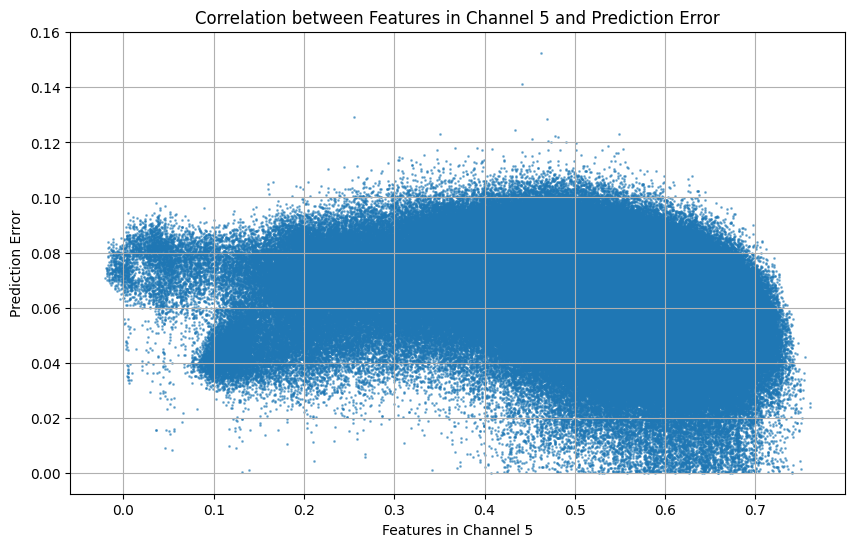

In [ ]:
import matplotlib.pyplot as plt
import scipy.stats

# Calculate correlation
correlation, p_value = scipy.stats.pearsonr(features, errors)
print(f"Correlation between features in channel 5 and prediction error: {correlation:.4f} (p-value: {p_value:.4e})")

# Plot the correlation
plt.figure(figsize=(10, 6))
plt.scatter(features, errors, alpha=0.5, s=1)
plt.title('Correlation between Features in Channel 5 and Prediction Error')
plt.xlabel('Features in Channel 5')
plt.ylabel('Prediction Error')
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import torch

def extract_features_and_errors(model, test_loader):
    model.eval()
    all_channel_features = [[] for _ in range(5)]  # Assuming 5 channels
    prediction_errors = []

    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.cuda(), targets.cuda()
            outputs = model(inputs)

            # Convert to numpy for processing
            inputs = inputs.cpu().numpy()
            targets = targets.cpu().numpy()
            outputs = outputs.cpu().numpy()

            # Extract features from all channels
            for channel in range(5):
                features = inputs[:, channel, :, :]  # Extracting each channel
                all_channel_features[channel].extend(features.flatten())

            # Compute the prediction errors
            errors = np.abs(outputs - targets)
            prediction_errors.extend(errors.flatten())

    all_channel_features = [np.array(features) for features in all_channel_features]
    return all_channel_features, np.array(prediction_errors)

# Assuming new_test_loader is defined and the model is loaded
all_features, errors = extract_features_and_errors(model, new_test_loader)


Correlation between features in channel 1 and prediction error: 0.3154 (p-value: 0.0000e+00)
Correlation between features in channel 2 and prediction error: 0.2087 (p-value: 0.0000e+00)
Correlation between features in channel 3 and prediction error: 0.2768 (p-value: 0.0000e+00)
Correlation between features in channel 4 and prediction error: -0.1288 (p-value: 0.0000e+00)
Correlation between features in channel 5 and prediction error: -0.2254 (p-value: 0.0000e+00)


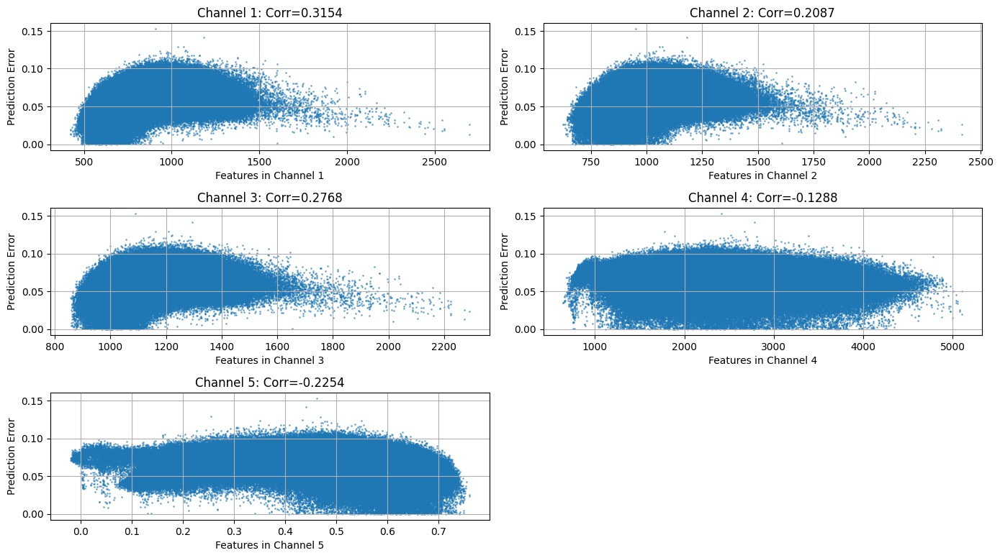

In [ ]:
import matplotlib.pyplot as plt
import scipy.stats

# Calculate correlation for each channel
correlations = []
p_values = []
for channel in range(5):
    correlation, p_value = scipy.stats.pearsonr(all_features[channel], errors)
    correlations.append(correlation)
    p_values.append(p_value)
    print(f"Correlation between features in channel {channel + 1} and prediction error: {correlation:.4f} (p-value: {p_value:.4e})")

# Plot the correlations for all channels
plt.figure(figsize=(14, 10))
for channel in range(5):
    plt.subplot(4, 2, channel + 1)
    plt.scatter(all_features[channel], errors, alpha=0.5, s=1)
    plt.title(f'Channel {channel + 1}: Corr={correlations[channel]:.4f}')
    plt.xlabel(f'Features in Channel {channel + 1}')
    plt.ylabel('Prediction Error')
    plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming fold_train_losses and fold_val_losses are lists of lists where each sublist corresponds to a fold
for i, (train_losses, val_losses) in enumerate(zip(fold_train_losses, fold_val_losses)):
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title(f'Learning Curve for Fold {i+1}')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()


NameError: name 'fold_train_losses' is not defined